In [1]:
#Import necessary packages

import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split 
import re
from bs4 import BeautifulSoup

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
os.chdir('/content/drive/My Drive/Colab Notebooks/NLP/')

In [36]:
#Read input excel sheet

df = pd.read_excel("input_data.xlsx", sheet_name=None)

In [37]:
#Get the dataframe from first sheet

dfn = df['Sheet1']

In [ ]:
#Lets see head of the dataframe

dfn.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [ ]:
#Shape of the dataframe

dfn.shape

(8500, 4)

In [ ]:
#Check data types

dfn.dtypes

Short description    object
Description          object
Caller               object
Assignment group     object
dtype: object

# Text Pre-Processing

In [ ]:
#Check for blanks

dfn.isna().sum()

Short description    8
Description          1
Caller               0
Assignment group     0
dtype: int64

In [38]:
#We are more interested in Description column as it clearly looks like superset of short description
#So lets see that row with blank value for Description

dfn[dfn['Description'].isna()]

,Short description,Description,Caller,Assignment group
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [39]:
#Lets fill the description value above with what we have for short description

dfn.iloc[4395, dfn.columns.get_loc('Description')] = dfn.iloc[4395, dfn.columns.get_loc('Short description')]

In [ ]:
#Lets check for nulls

dfn.isnull().sum()

Short description    8
Description          0
Caller               0
Assignment group     0
dtype: int64

We will be using Description column data for training, so we can ignore Short description and Caller

In [40]:
dfn = dfn.drop(['Short description'], axis=1)
dfn = dfn.drop(['Caller'], axis=1)

In [41]:
#We noticed there are so many unwanted sequences in Description column
#Lets get rid of those

dfn["Description"] = dfn["Description"].astype(str) 
dfn = dfn.replace('\r\n','', regex=True)

In [42]:
#Remove Date and time from description

dfn["Description"] = dfn["Description"].replace('\d{2}/\d{2}/\d{4} \d{2}:\d{2}:\d{2}','', regex=True)

In [43]:
#Remove html characters if any

def strip_html_tags(text):
    """remove html tags from text"""
    soup = BeautifulSoup(text, "html.parser")
    stripped_text = soup.get_text(separator=" ")
    return stripped_text

dfn['Description'] = dfn['Description'].apply(lambda x: strip_html_tags(x))

In [44]:
pip install unidecode

     |████████████████████████████████| 245kB 7.2MB/s 


In [45]:
#Remove Accented Characters if any
import unidecode

def remove_accented_chars(text):
    """remove accented characters from text, e.g. café"""
    text = unidecode.unidecode(text)
    return text

dfn['Description'] = dfn['Description'].apply(lambda x: remove_accented_chars(x))

In [46]:
pip install -U nltk

     |████████████████████████████████| 1.4MB 7.3MB/s 
  Created wheel for nltk: filename=nltk-3.5-cp36-none-any.whl size=1434676 sha256=686ddb59633511e60a2451ed39d4d73691e81c4db137c6d28679ced557c1fc39
  Stored in directory: /root/.cache/pip/wheels/ae/8c/3f/b1fe0ba04555b08b57ab52ab7f86023639a526d8bc8d384306
Successfully built nltk
  Found existing installation: nltk 3.2.5
    Uninstalling nltk-3.2.5:
      Successfully uninstalled nltk-3.2.5


In [47]:
#Filter out punctuations

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize


def filter_punctuations(text):
    tokens = word_tokenize(text)
    # remove all tokens that are not alphabetic
    words = [word for word in tokens if word.isalpha()]
    return ' '.join(words)

dfn['Description'] = dfn['Description'].apply(lambda x: filter_punctuations(x))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [48]:
#Lowercase the description

dfn['Description'] = dfn['Description'].apply(lambda x: x.lower())

In [49]:
#Remove digits and word containing digits

dfn['Description'] = dfn['Description'].apply(lambda x: re.sub('\w*\d\w*','', x))

In [50]:
#Expand Contractions

# Dictionary of English Contractions
contractions_dict = { "ain't": "are not","'s":" is","aren't": "are not",
                     "can't": "cannot","can't've": "cannot have",
                     "'cause": "because","could've": "could have","couldn't": "could not",
                     "couldn't've": "could not have", "didn't": "did not","doesn't": "does not",
                     "don't": "do not","hadn't": "had not","hadn't've": "had not have",
                     "hasn't": "has not","haven't": "have not","he'd": "he would",
                     "he'd've": "he would have","he'll": "he will", "he'll've": "he will have",
                     "how'd": "how did","how'd'y": "how do you","how'll": "how will",
                     "I'd": "I would", "I'd've": "I would have","I'll": "I will",
                     "I'll've": "I will have","I'm": "I am","I've": "I have", "isn't": "is not",
                     "it'd": "it would","it'd've": "it would have","it'll": "it will",
                     "it'll've": "it will have", "let's": "let us","ma'am": "madam",
                     "mayn't": "may not","might've": "might have","mightn't": "might not", 
                     "mightn't've": "might not have","must've": "must have","mustn't": "must not",
                     "mustn't've": "must not have", "needn't": "need not",
                     "needn't've": "need not have","o'clock": "of the clock","oughtn't": "ought not",
                     "oughtn't've": "ought not have","shan't": "shall not","sha'n't": "shall not",
                     "shan't've": "shall not have","she'd": "she would","she'd've": "she would have",
                     "she'll": "she will", "she'll've": "she will have","should've": "should have",
                     "shouldn't": "should not", "shouldn't've": "should not have","so've": "so have",
                     "that'd": "that would","that'd've": "that would have", "there'd": "there would",
                     "there'd've": "there would have", "they'd": "they would",
                     "they'd've": "they would have","they'll": "they will",
                     "they'll've": "they will have", "they're": "they are","they've": "they have",
                     "to've": "to have","wasn't": "was not","we'd": "we would",
                     "we'd've": "we would have","we'll": "we will","we'll've": "we will have",
                     "we're": "we are","we've": "we have", "weren't": "were not","what'll": "what will",
                     "what'll've": "what will have","what're": "what are", "what've": "what have",
                     "when've": "when have","where'd": "where did", "where've": "where have",
                     "who'll": "who will","who'll've": "who will have","who've": "who have",
                     "why've": "why have","will've": "will have","won't": "will not",
                     "won't've": "will not have", "would've": "would have","wouldn't": "would not",
                     "wouldn't've": "would not have","y'all": "you all", "y'all'd": "you all would",
                     "y'all'd've": "you all would have","y'all're": "you all are",
                     "y'all've": "you all have", "you'd": "you would","you'd've": "you would have",
                     "you'll": "you will","you'll've": "you will have", "you're": "you are",
                     "you've": "you have"}

# Regular expression for finding contractions
contractions_re=re.compile('(%s)' % '|'.join(contractions_dict.keys()))

# Function for expanding contractions
def expand_contractions(text,contractions_dict=contractions_dict):
  def replace(match):
    return contractions_dict[match.group(0)]
  return contractions_re.sub(replace, text)

dfn['Description'] = dfn['Description'].apply(lambda x:expand_contractions(x))

In [51]:
#Filter out stopwords

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

def filter_stopwords(text):
    tokens = word_tokenize(text)
    # remove all tokens that are stopwords
    stop_words = set(stopwords.words('english'))
    words = [w for w in tokens if not w in stop_words]
    return ' '.join(words)

dfn['Description'] = dfn['Description'].apply(lambda x: filter_stopwords(x))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [52]:
#Lemmatization

import spacy

# Loading model
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

dfn['lemmatized'] = dfn['Description'].apply(lambda x: ' '.join([token.lemma_ for token in list(nlp(x))]))


In [53]:
#Check and remove empty rows after lemmatization

print(dfn.shape)
dfn = dfn[dfn['lemmatized'] != '']
print(dfn.shape)

(8500, 3)
(8430, 3)


In [54]:
#Lets group the lemmatized descriptions based on assignment groups

df_grouped = dfn[['Assignment group','lemmatized']].groupby(by='Assignment group').agg(lambda x:' '.join(x))
df_grouped.head(20)

,lemmatized
Assignment group,
GRP_0,user details employee manager name user name a...
GRP_1,event critical value mountpoint threshold toda...
GRP_10,receive fail receive fail receive fail receive...
GRP_11,hello service nee monitor manufacture drawing ...
GRP_12,c label server space consume space available g...
GRP_13,receive fail receive two customer account get ...
GRP_14,intermittent service configair server require ...
GRP_15,hi channel partner email address djhadkudhd re...
GRP_16,receive cid bwfhtumx japznrvb regional control...


In [55]:
# Lets create Document Term Matrix

from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(analyzer='word')
data = cv.fit_transform(df_grouped['lemmatized'])

df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index = df_grouped.index
df_dtm.head(10)

,aa,aaa,aaeur,aao,aaymanncustom,ab,abandon,abap,abarbeiten,abc,abca,abcdegy,abcdri,abd,abdhtyu,abend,abende,abended,aber,abertura,abfragetimeout,abgebildet,abgebrochen,abgelaufen,abgeschlossen,abgesprochen,abgrtyreu,abhanden,abhandengekommen,abhay,abhilfe,abholen,abholung,ability,abl,able,abmelden,abode,abort,abovementione,...,zugang,zugordnet,zugriff,zugriffe,zugriffs,zugriffsrechte,zuhause,zuhoylts,zukommen,zulassen,zum,zumindest,zuothryrt,zur,zura,zurtxjbd,zurzeit,zusammen,zuschaltung,zusta,zuteillisten,zuvjqgwa,zuvor,zuyimtsf,zvjxuahe,zvmesjpt,zvnxlobq,zvnxlobqdirecteur,zvygmnco,zwar,zwei,zweites,zwip,zwischen,zwrypjqv,zwutmehy,zwwirep,zxdtskpw,zyjfpgtk,zz
Assignment group,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
GRP_0,0,2,0,0,1,1,0,2,0,1,0,0,1,1,2,0,0,0,7,0,0,0,1,0,1,0,1,1,0,0,2,0,0,1,1,266,0,0,0,0,...,1,0,18,1,1,0,1,1,0,0,3,0,1,1,8,0,1,4,1,0,1,0,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,1,0,0
GRP_1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
GRP_10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
GRP_11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
GRP_12,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,9,0,0,0,0,...,0,0,7,0,0,1,0,0,0,1,1,0,0,0,2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
GRP_13,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
GRP_14,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
GRP_15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
GRP_16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


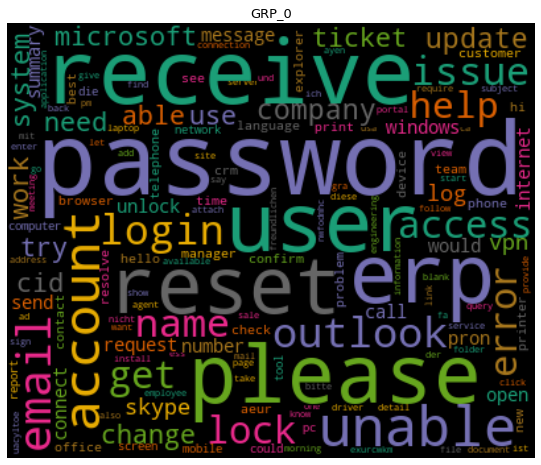

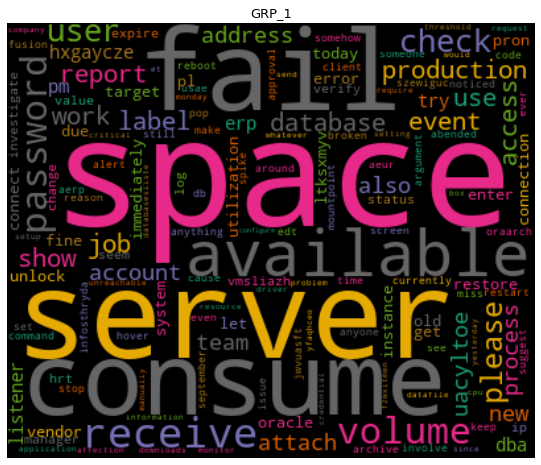

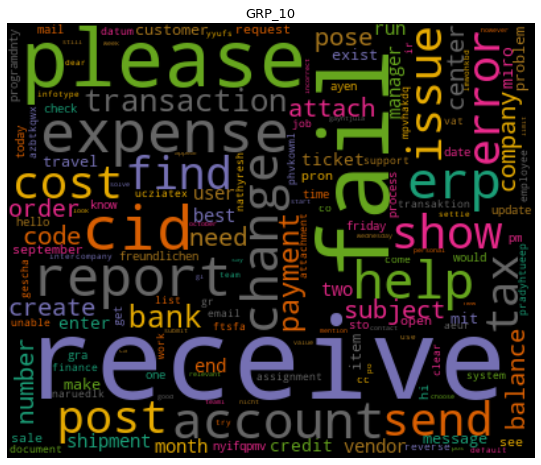

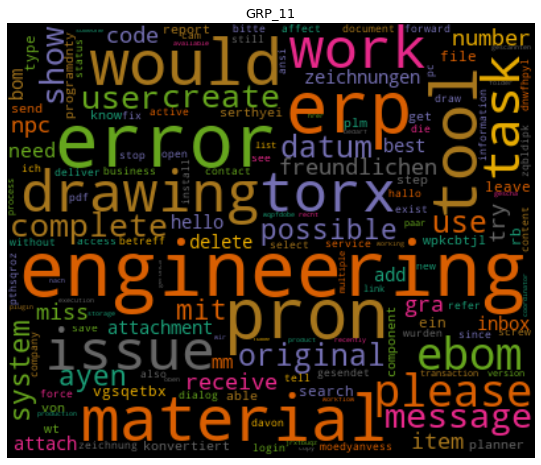

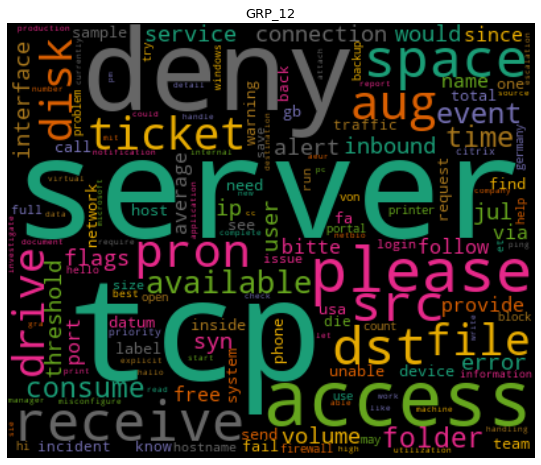

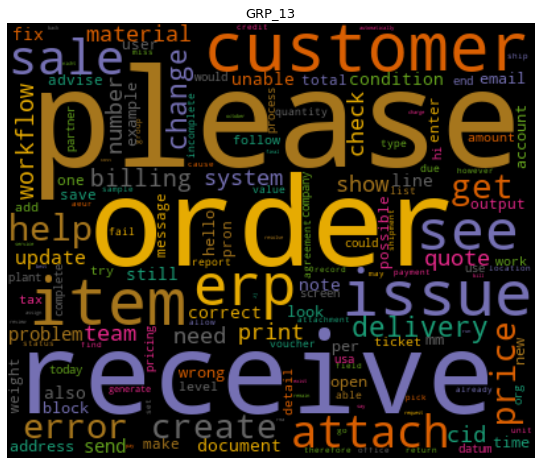

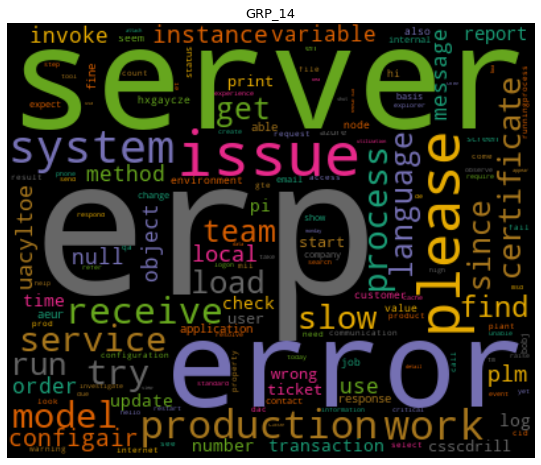

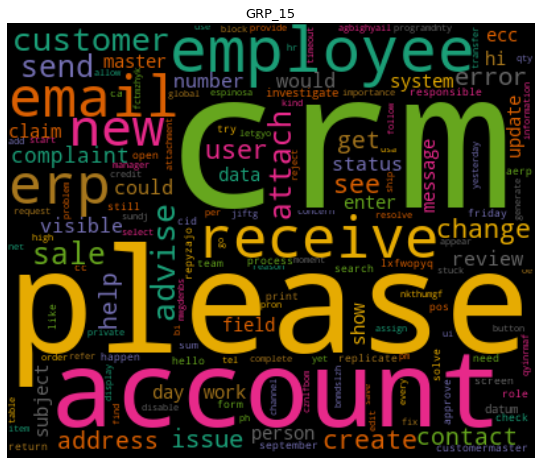

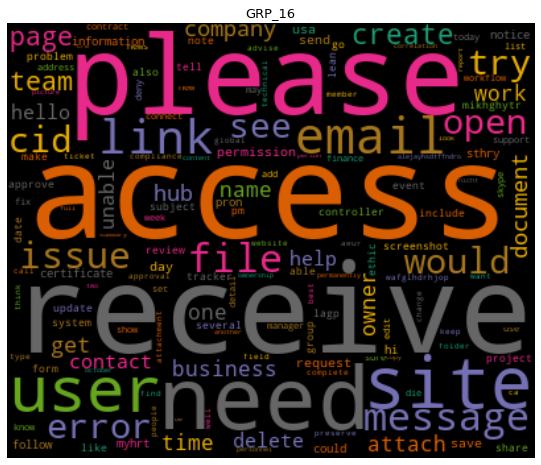

Error happened


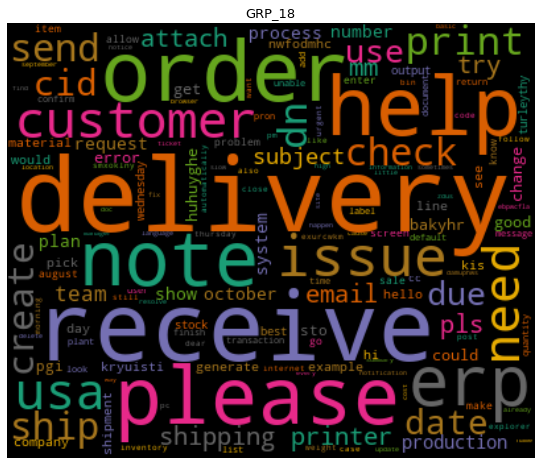

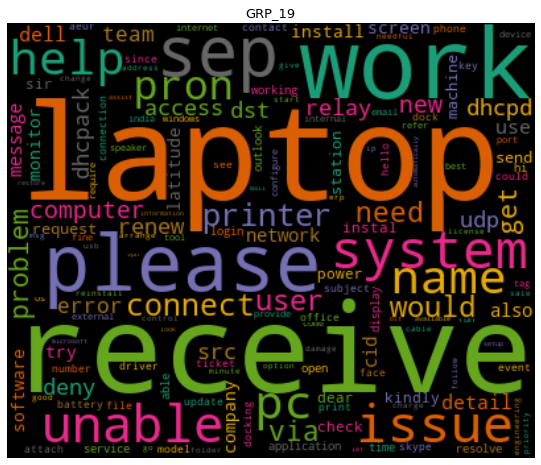

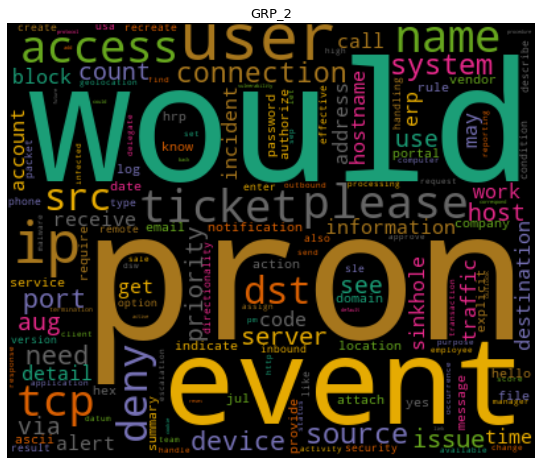

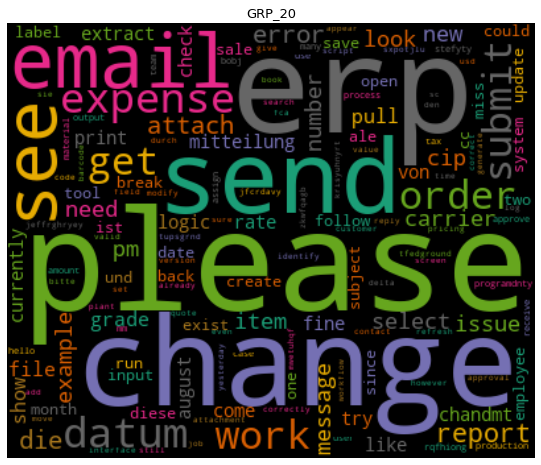

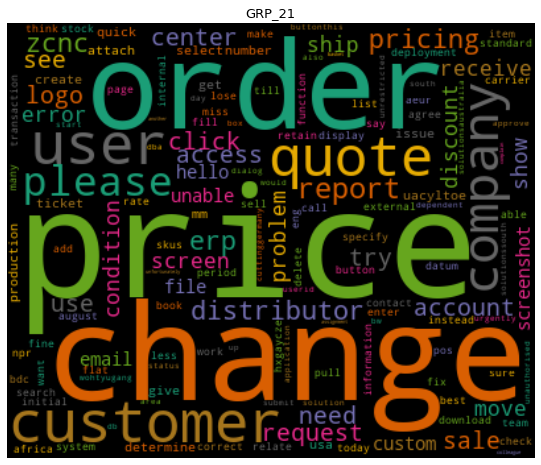

...

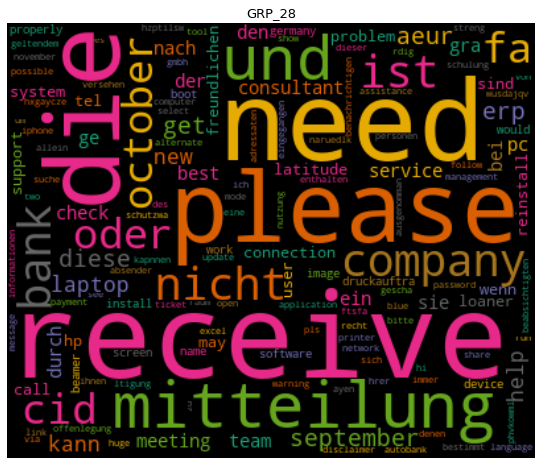

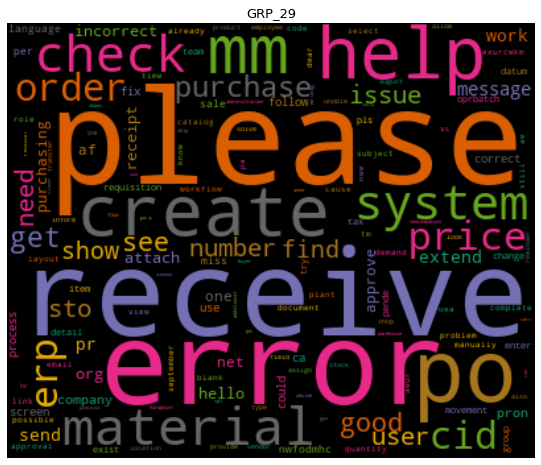

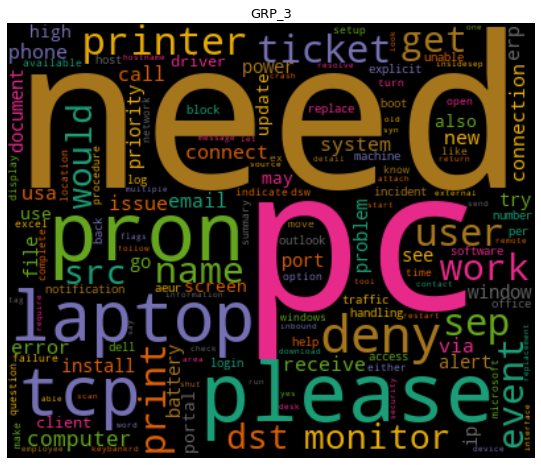

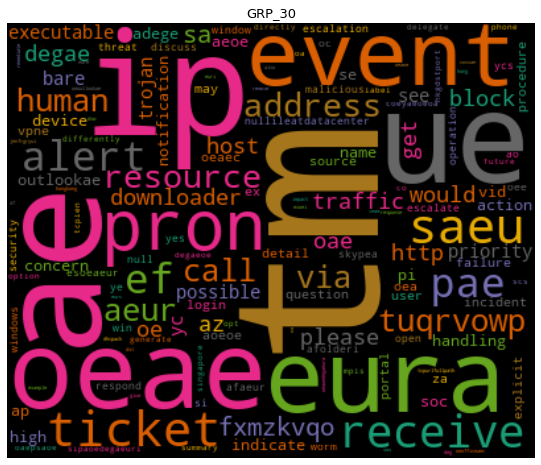

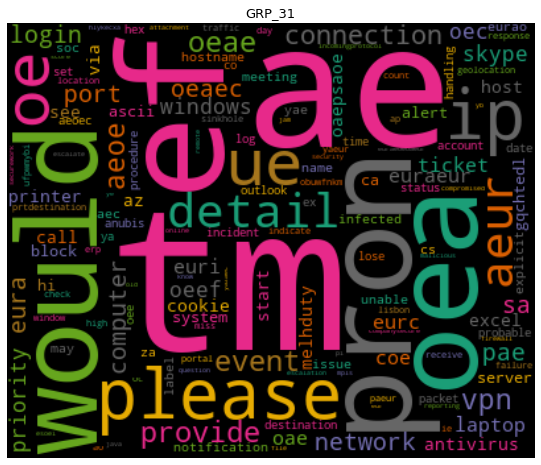

Error happened


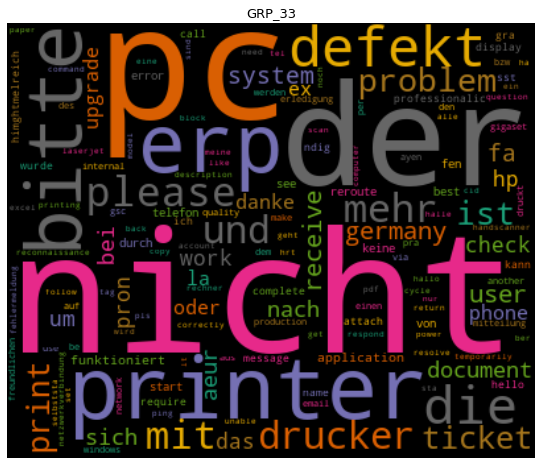

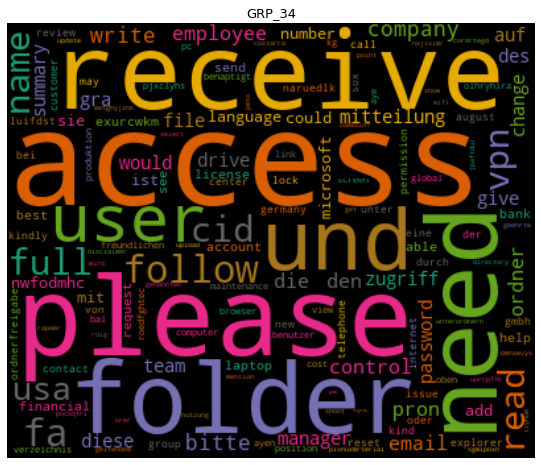

Error happened


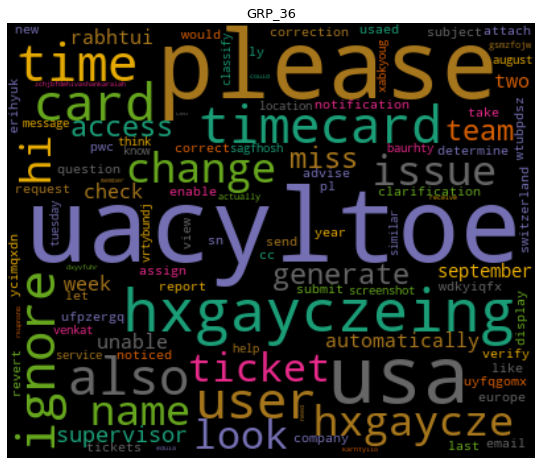

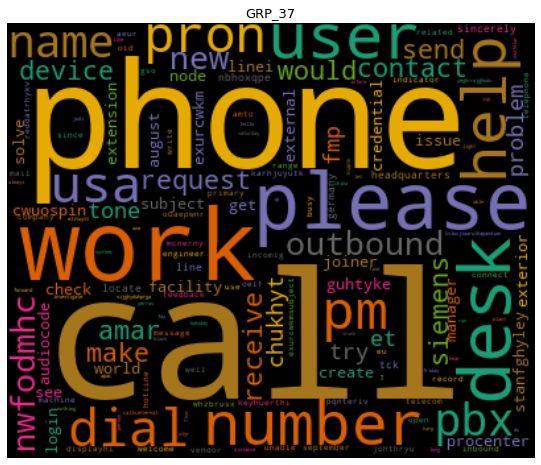

Error happened


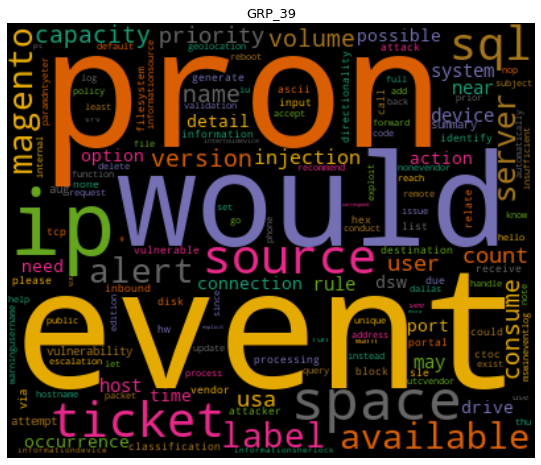

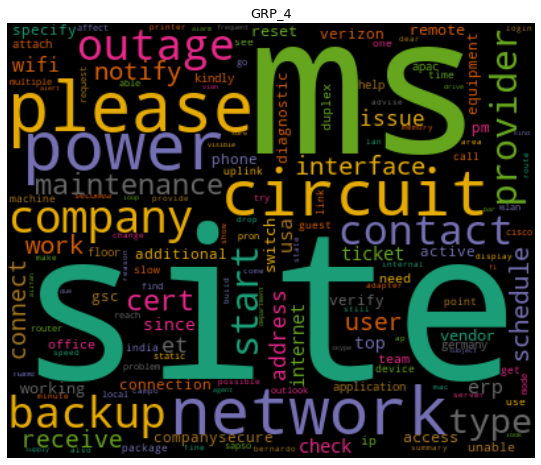

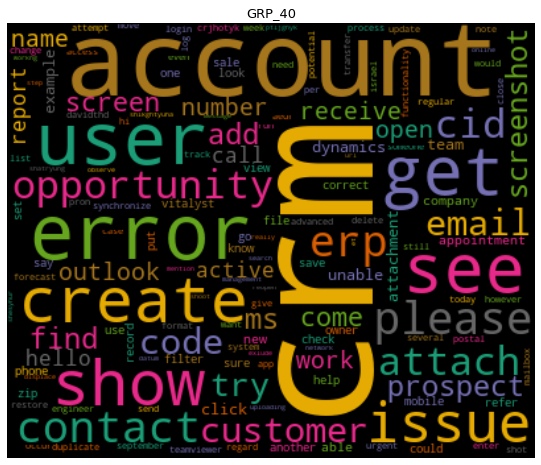

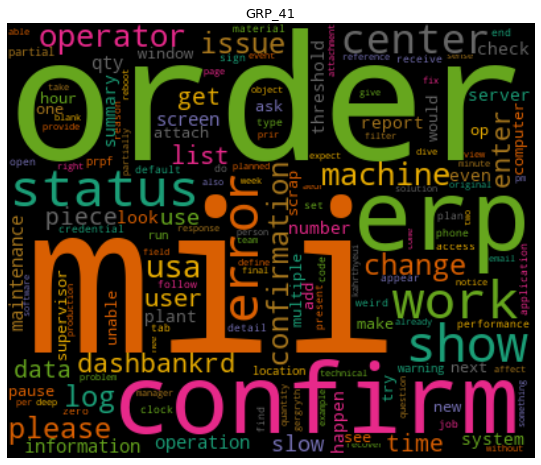

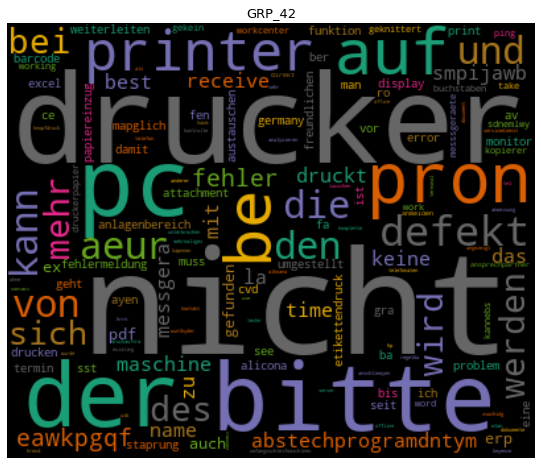

Error happened


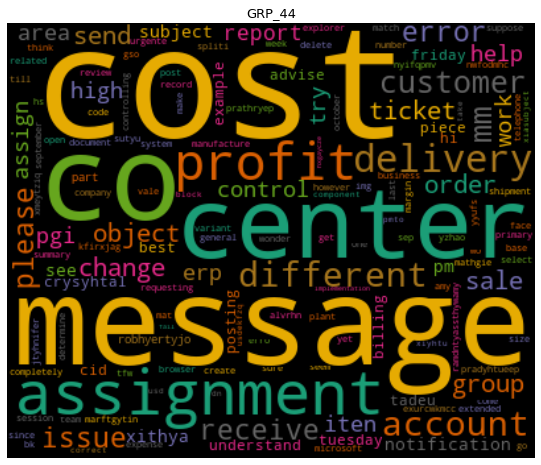

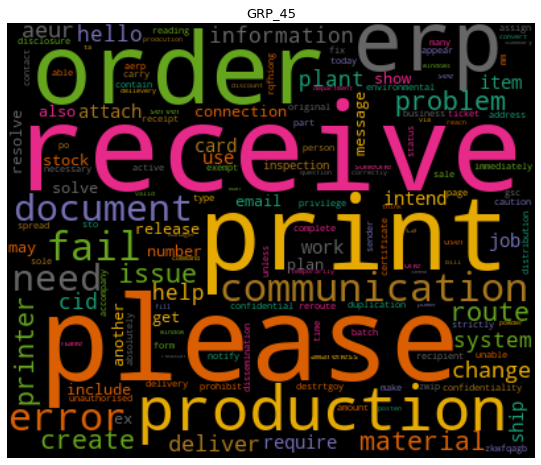

Error happened


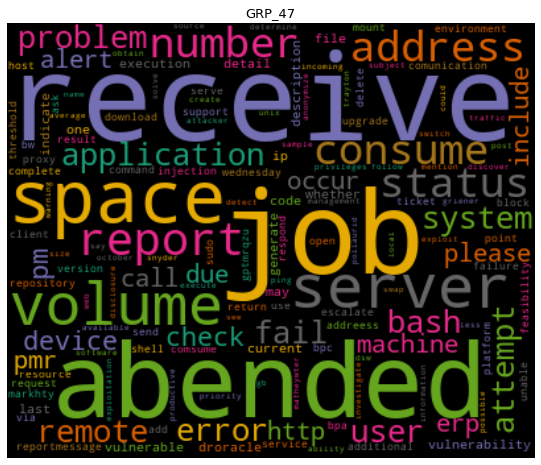

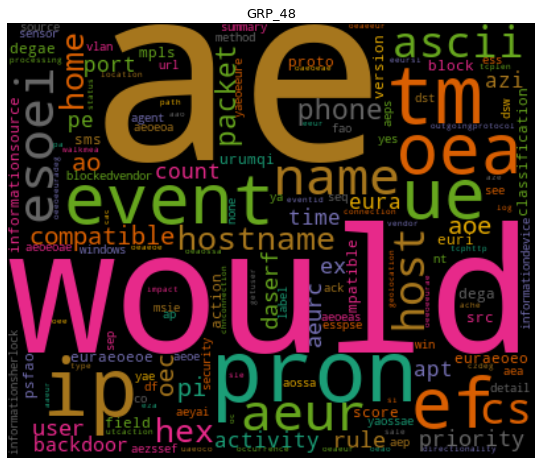

Error happened


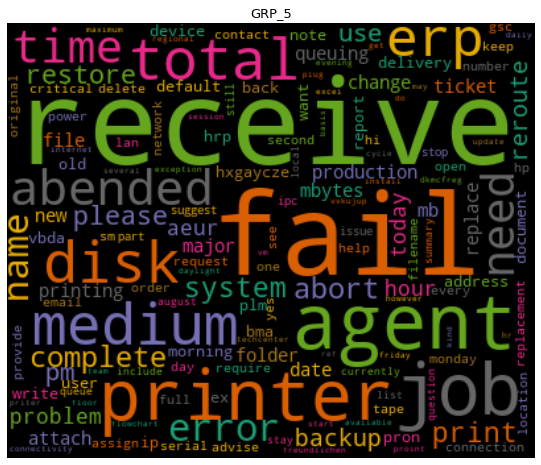

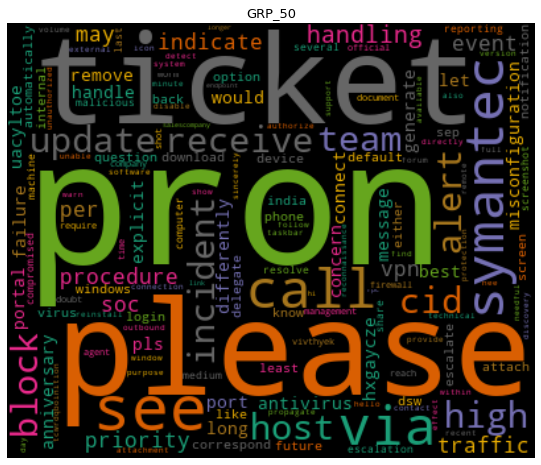

Error happened
Error happened
Error happened
Error happened
Error happened
Error happened
Error happened
Error happened


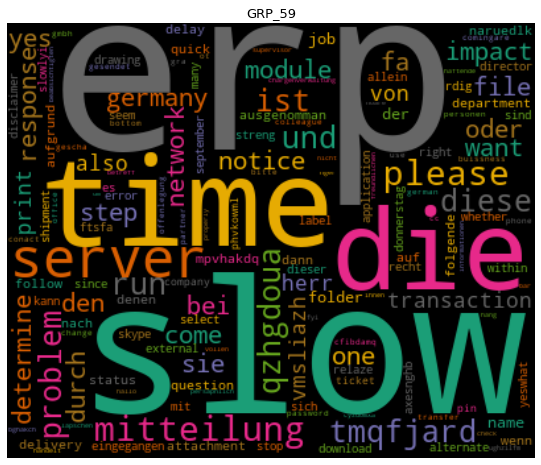

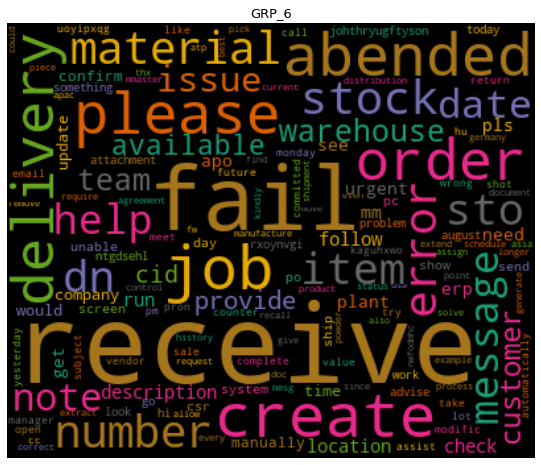

Error happened
Error happened


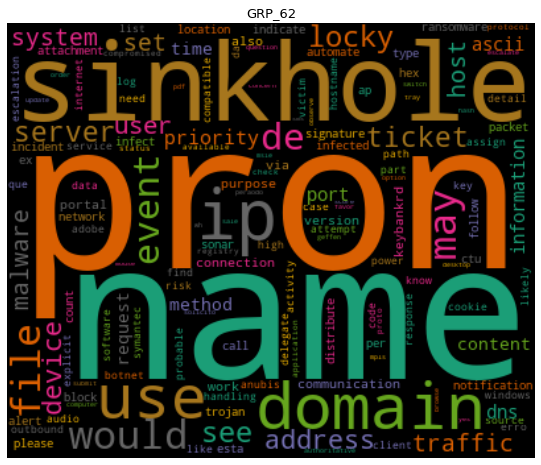

Error happened
Error happened
Error happened
Error happened
Error happened
Error happened


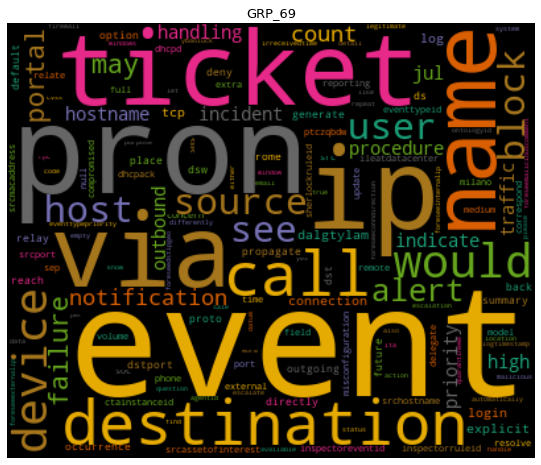

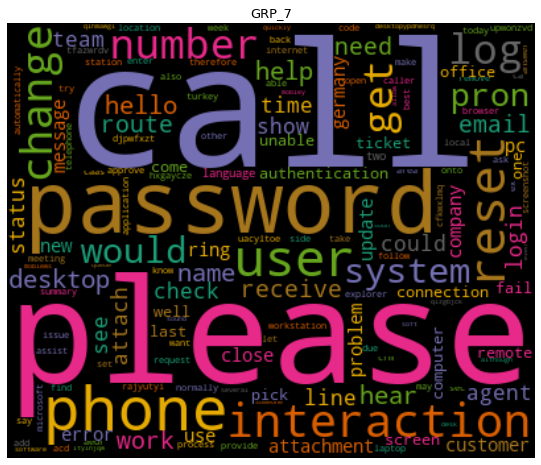

Error happened
Error happened
Error happened
Error happened


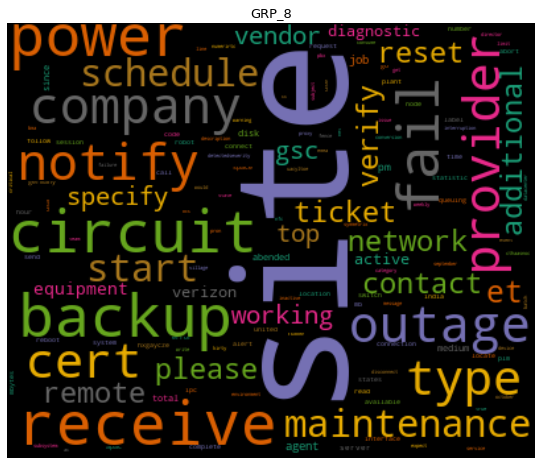

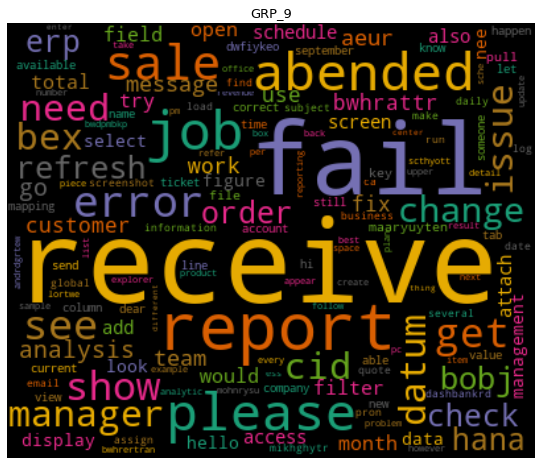

In [56]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data,title):
  try:
    wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()
  except:
    print("Error happened")
  
# Transposing document term matrix
df_dtm = df_dtm.transpose()


# Plotting word cloud for each group
for index, group in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[group].sort_values(ascending=False), group)

In [57]:
#From the word cloud its evident that GRP_5 has 'receive' and 'fail' as primary words and GRP_0 has those as well
#So lets check whether we can merge them

uniqueGrp5 = set()
dfgrp5 = dfn[dfn['Assignment group'] == 'GRP_5']
dfgrp5['lemmatized'].str.lower().str.split().apply(uniqueGrp5.update)

uniqueGrp0 = set()
dfgrp0 = dfn[dfn['Assignment group'] == 'GRP_0']
dfgrp0['lemmatized'].str.lower().str.split().apply(uniqueGrp0.update)

uniqueGrp6 = set()
dfgrp6 = dfn[dfn['Assignment group'] == 'GRP_6']
dfgrp6['lemmatized'].str.lower().str.split().apply(uniqueGrp6.update)

uniqueGrp47 = set()
dfgrp47 = dfn[dfn['Assignment group'] == 'GRP_47']
dfgrp47['lemmatized'].str.lower().str.split().apply(uniqueGrp47.update)

print(len(uniqueGrp5))
print(len(uniqueGrp0))
print(len(uniqueGrp6))
print(len(uniqueGrp47))

print('')

print(len(uniqueGrp5 - uniqueGrp0))
print(len(uniqueGrp6 - uniqueGrp0))
print(len(uniqueGrp47 - uniqueGrp0))

333
5089
380
178

70
93
45


In [58]:
#As we can see above out of 332 words, (332 - 70 = 262) words are present in GRP_0, so it will be good idea to merge GRP_5 with GRP_0
dfn.loc[dfn['Assignment group'] == "GRP_5", "Assignment group"] = "GRP_0"

#Similarly for GRP_6 and GRP_47
dfn.loc[dfn['Assignment group'] == "GRP_6", "Assignment group"] = "GRP_0"
dfn.loc[dfn['Assignment group'] == "GRP_47", "Assignment group"] = "GRP_0"

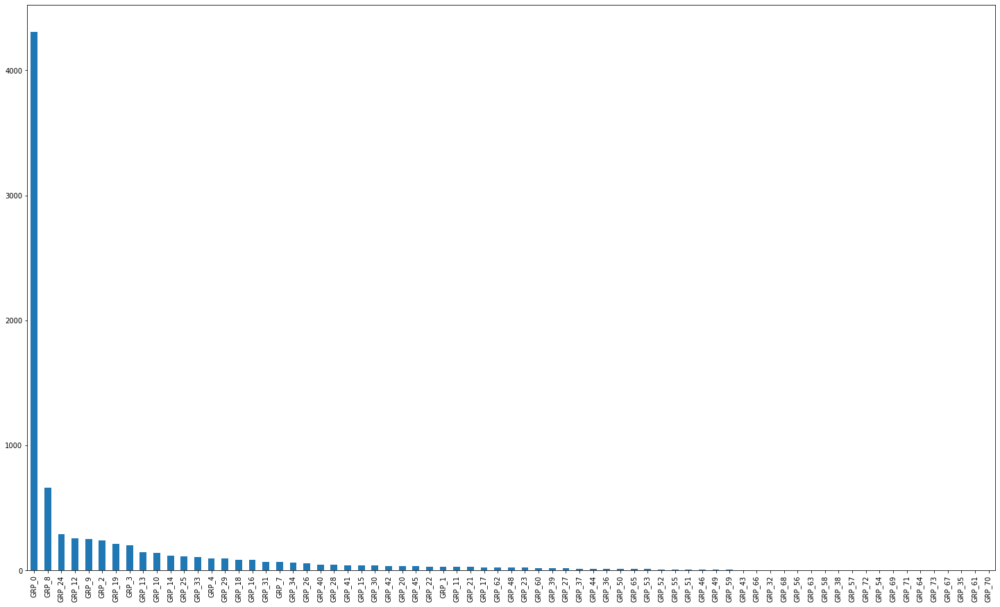

In [59]:
#Lets check how balanced our classification is

dfn['Assignment group'].value_counts().plot(kind='bar', figsize=(25,15));

We can see how unbalanced our dataset is. We will try to make use of NLP data augmentation techniques.

In [60]:
#We dont need Description column anymore

dfn = dfn.drop(['Description'], axis=1)

In [61]:
import pandas as pd
import nltk


def data_augmentation_spacy(df):
    df['Assignment group'] = df['Assignment group'].apply(str)
    df.sort_values(by='Assignment group', axis=0, inplace=True)
    df.reset_index(drop=False, inplace=True)

    
    print(df['Assignment group'].value_counts())

    
    nltk.download('stopwords')
    # load nltk's English stopwords as variable called 'stop' and don't find synonym of those words.
    stop = nltk.corpus.stopwords.words('english')

    ## Tokenizing sentence into token for finding synonym.
    def make_tokenizer(texts):
        from keras.preprocessing.text import Tokenizer
        t = Tokenizer()
        t.fit_on_texts(texts)
        return t

    tokenizer = make_tokenizer(df['lemmatized'])  ## Message is column name

    X = tokenizer.texts_to_sequences(df['lemmatized'])

    from keras.preprocessing.sequence import pad_sequences
    X = pad_sequences(X, 70)

    ## Dictionary of word index
    index_word = {}
    for word in tokenizer.word_index.keys():
        index_word[tokenizer.word_index[word]] = word

    ## word list
    words = [value for key, value in index_word.items()]

    ## Function to find synonym of words
    import spacy
    nlp = spacy.load('en', parser=False)

    def check_lemma(t, w):
        r = [d for d in t if (nlp(d.text)[0].lemma_ != nlp(w.text)[0].lemma_)]
        return r

    def get_word_synonym(word):
        filtered_words = [w for w in word.vocab if (
            not w.lower_ in stop) and w.is_lower == word.is_lower and w.prob >= -15]  ## (not w.lower_ in stop) and
        similarity = sorted(filtered_words, key=lambda w: word.similarity(w), reverse=True)
        filtered_similarity = check_lemma(similarity[:30], word)
        return filtered_similarity[:3]

    ## Synonym dictionary
    synonym_dict = {}

    def check_oos(synonym_dict, key):
        if key in synonym_dict.keys():
            return True
        else:
            return False

    for word in words:
        # if (not check_oos(word)) :
        if (not check_oos(synonym_dict, word)):
            synonym_dict.update({word: tuple([w.lower_ for w in get_word_synonym(nlp.vocab[word])])})
            # print(word, " : ", [w.lower_ for w in get_word_synonym(nlp.vocab[word])])

    ## Only consider filtered synonym
    import collections
    value_occurrences = collections.Counter(synonym_dict.values())

    filtered_synonym = {key: value for key, value in synonym_dict.items() if value_occurrences[value] == 1}

    ## Function for augmenting data by replacing words with synonym using spaCy

    import re
    import random
    sr = random.SystemRandom()
    split_pattern = re.compile(r'\s+')

    def data_augmentation(message, aug_range=1):
        augmented_messages = []
        for j in range(0, aug_range):
            new_message = ""
            for i in filter(None, split_pattern.split(message)):
                new_message = new_message + " " + sr.choice(filtered_synonym.get(i, [i]))
            augmented_messages.append(new_message)
        return augmented_messages

    ## Dictionary for group count
    ## Assignment Group is column name
    group_count = df['Assignment group'].value_counts().to_dict()

    ## Get max intent count to match other minority classes through data augmentation
    import operator
    max_group_count = max(group_count.items(), key=operator.itemgetter(1))[1]

    ## Loop to interate all messages
    import numpy as np
    import math
    import tqdm
    newdf = pd.DataFrame()
    for group, count in group_count.items():
        count_diff = max_group_count - count  ## Difference to fill
        multiplication_count = math.ceil(
            (count_diff) / count)  ## Multiplying a minority classes for multiplication_count times
        if (multiplication_count):
            old_message_df = pd.DataFrame()
            new_message_df = pd.DataFrame()
            for message in tqdm.tqdm(df[df["Assignment group"] == group]["lemmatized"]):
                ## Extracting existing minority class batch
                dummy1 = pd.DataFrame([message], columns=['lemmatized'])
                dummy1["Assignment group"] = group
                old_message_df = old_message_df.append(dummy1)

                ## Creating new augmented batch from existing minority class
                new_messages = data_augmentation(message, multiplication_count)
                dummy2 = pd.DataFrame(new_messages, columns=['lemmatized'])
                dummy2["Assignment group"] = group
                new_message_df = new_message_df.append(dummy2)

            ## Select random data points from augmented data
            new_message_df = new_message_df.take(np.random.permutation(len(new_message_df))[:count_diff])

            ## Merge existing and augmented data points
            newdf = newdf.append([old_message_df, new_message_df])
        else:
            newdf = newdf.append(df[df["Assignment group"] == group])

    newdf['Assignment group'].replace(to_replace=["GRP_00", "GRP_01", "GRP_02", "GRP_03", "GRP_04"],
                                                     value="GRP_0", inplace=True)
    return newdf

In [62]:
#Spacy Augmentation
df_aug = data_augmentation_spacy(dfn)

#Append df_aug to parent dataframe dfn
dfn = dfn.append(df_aug)

GRP_0     4308
GRP_8      660
GRP_24     289
GRP_12     257
GRP_9      252
          ... 
GRP_73       1
GRP_67       1
GRP_35       1
GRP_61       1
GRP_70       1
Name: Assignment group, Length: 71, dtype: int64


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


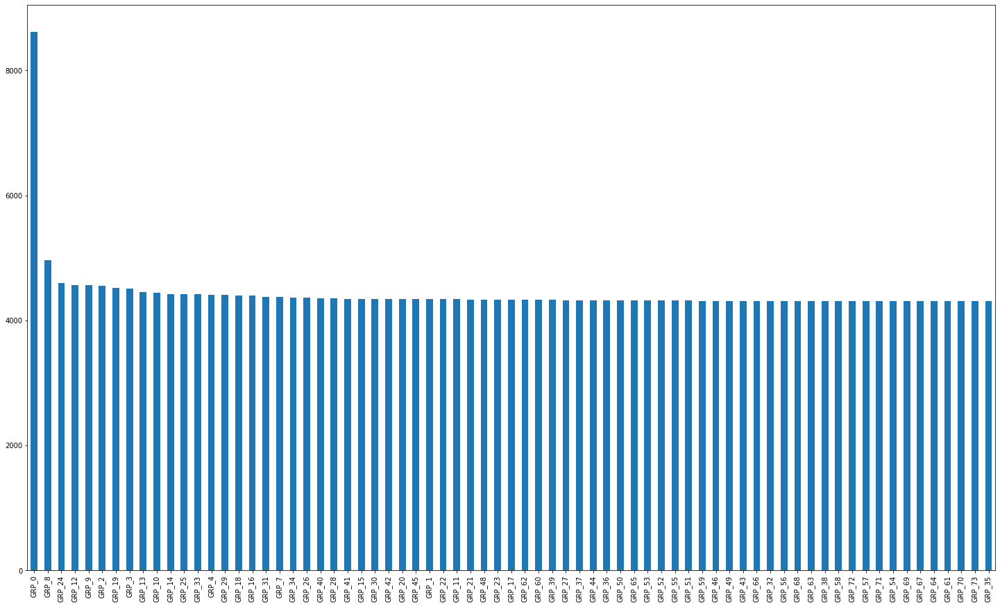

In [63]:
dfn['Assignment group'].value_counts().plot(kind='bar', figsize=(25,15));

In [64]:
from sklearn.utils import resample

dfnr = dfn[0:0]
for grp in dfn['Assignment group'].unique():
    d = dfn[dfn['Assignment group'] == grp]
    r = resample(d, replace=True, n_samples=800, random_state=42)
    dfnr = dfnr.append(r)

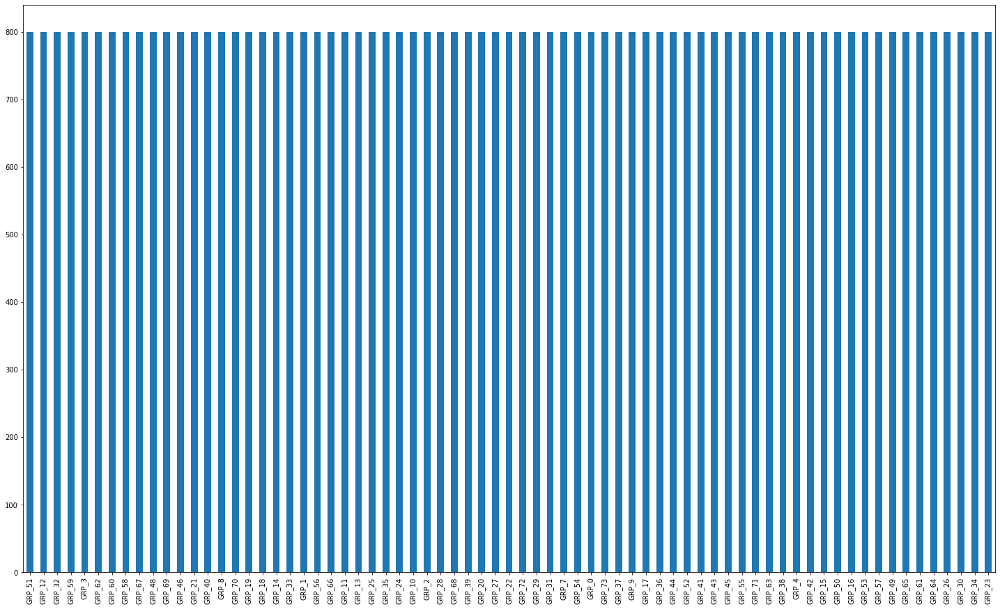

In [65]:
dfnr['Assignment group'].value_counts().plot(kind='bar', figsize=(25,15));

# Lets try our "Naive" Naive Bayes Classification

In [32]:
#Separate train and target columns

X = dfnr.lemmatized
y = dfnr['Assignment group']

In [33]:
#Split the data into train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [34]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.metrics import accuracy_score

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(X_train, y_train)

from sklearn.metrics import classification_report
y_pred = nb.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))

accuracy 0.8830105633802817


# Lets try text classification using Keras 

In [66]:
dfn_k = dfn.copy()

In [67]:
dfn_k['AG'] = dfn_k['Assignment group'].str[4:]

In [69]:
import numpy as np

from sklearn.preprocessing import LabelBinarizer, LabelEncoder
from sklearn.metrics import confusion_matrix

from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.preprocessing import text, sequence
from keras import utils

train_size = int(len(dfn_k) * .7)
train_posts = dfn_k['lemmatized'][:train_size]
train_tags = dfn_k['AG'][:train_size]

test_posts = dfn_k['lemmatized'][train_size:]
test_tags = dfn_k['AG'][train_size:]

max_words = 1000
tokenize = text.Tokenizer(num_words=max_words, char_level=False)
tokenize.fit_on_texts(train_posts) # only fit on train

x_train = tokenize.texts_to_matrix(train_posts)
x_test = tokenize.texts_to_matrix(test_posts)

encoder = LabelEncoder()
encoder.fit(train_tags)
y_train = encoder.transform(train_tags)
y_test = encoder.transform(test_tags)

num_classes = np.max(y_train) + 1
y_train = utils.to_categorical(y_train, num_classes)
y_test = utils.to_categorical(y_test, num_classes)

batch_size = 32
epochs = 20

# Build the model
kmodel = Sequential()
kmodel.add(Dense(512, input_shape=(max_words,)))
kmodel.add(Activation('relu'))
kmodel.add(Dropout(0.5))
kmodel.add(Dense(num_classes))
kmodel.add(Activation('softmax'))

kmodel.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
              
history = kmodel.fit(x_train, y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1,
                    validation_split=0.1)

Epoch 1/20
6188/6188 [==============================] - 24s 4ms/step - loss: 0.6149 - accuracy: 0.8291 - val_loss: 10.0263 - val_accuracy: 0.0530
Epoch 2/20
6188/6188 [==============================] - 23s 4ms/step - loss: 0.2873 - accuracy: 0.9033 - val_loss: 6.8331 - val_accuracy: 0.1239
Epoch 3/20
6188/6188 [==============================] - 24s 4ms/step - loss: 0.2503 - accuracy: 0.9113 - val_loss: 3.9879 - val_accuracy: 0.2877
Epoch 4/20
6188/6188 [==============================] - 23s 4ms/step - loss: 0.2346 - accuracy: 0.9144 - val_loss: 1.8542 - val_accuracy: 0.5286
Epoch 5/20
6188/6188 [==============================] - 23s 4ms/step - loss: 0.2253 - accuracy: 0.9165 - val_loss: 1.4034 - val_accuracy: 0.6149
Epoch 6/20
6188/6188 [==============================] - 23s 4ms/step - loss: 0.2211 - accuracy: 0.9170 - val_loss: 0.8330 - val_accuracy: 0.7704
Epoch 7/20
6188/6188 [==============================] - 23s 4ms/step - loss: 0.2169 - accuracy: 0.9184 - val_loss: 0.5115 - val_a

# Lets try XLNet now

In [4]:
!pip install pytorch-transformers
!pip install transformers

In [3]:
import torch
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split

from transformers import TFXLNetForSequenceClassification, XLNetForSequenceClassification
from pytorch_transformers import XLNetModel, XLNetTokenizer
from pytorch_transformers import AdamW

from tqdm import tqdm, trange
import pandas as pd
import io
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline

In [4]:
CUDA_LAUNCH_BLOCKING="1"

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
n_gpu = torch.cuda.device_count()
torch.cuda.get_device_name(0)

'Tesla K80'

In [6]:
dfnr = pd.read_csv("dfnrV3.csv")

In [8]:
sentences = dfnr.lemmatized.values

In [9]:
sentences = [sentence + " [SEP] [CLS]" for sentence in sentences]

In [10]:
dfnr['AG'] = dfnr['Assignment group'].str[4:]
lbls = dfnr["AG"].values
labels = [int(numeric_string) for numeric_string in lbls]

In [11]:
#no of groups
groups = dfnr.AG.nunique()

In [12]:
sentences[0]

'blank call call come get disconnected [SEP] [CLS]'

In [13]:
tokenizer = XLNetTokenizer.from_pretrained('xlnet-base-cased', do_lower_case=True)

tokenized_texts = [tokenizer.tokenize(sent) for sent in sentences]
print ("Tokenize the first sentence:")
print (tokenized_texts[0])

Tokenize the first sentence:
['▁blank', '▁call', '▁call', '▁come', '▁get', '▁disconnected', '▁[', 's', 'ep', ']', '▁[', 'cl', 's', ']']


In [14]:
MAX_LEN = 128

In [15]:
input_ids = [tokenizer.convert_tokens_to_ids(x) for x in tokenized_texts]

In [16]:
input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", truncating="post", padding="post")

In [17]:
# Create attention masks
attention_masks = []

# Create a mask of 1s for each token followed by 0s for padding
for seq in input_ids:
  seq_mask = [float(i>0) for i in seq]
  attention_masks.append(seq_mask)

In [18]:
#Use train_test_split to split our data into train and validation sets for training

train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(input_ids, labels, 
                                                            random_state=56, test_size=0.2)
train_masks, validation_masks, _, _ = train_test_split(attention_masks, input_ids,
                                             random_state=56, test_size=0.2)

In [19]:
# Convert all of our data into torch tensors, the required datatype for our model

train_inputs = torch.tensor(train_inputs)
validation_inputs = torch.tensor(validation_inputs)
train_labels = torch.tensor(train_labels)
validation_labels = torch.tensor(validation_labels)
train_masks = torch.tensor(train_masks)
validation_masks = torch.tensor(validation_masks)

In [20]:
# Select a batch size for training. For fine-tuning with XLNet, the authors recommend a batch size of 32, 48, or 128. We will use 32 here to avoid memory issues.
batch_size = 32

# Create an iterator of our data with torch DataLoader. This helps save on memory during training because, unlike a for loop, 
# with an iterator the entire dataset does not need to be loaded into memory

train_data = TensorDataset(train_inputs, train_masks, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

validation_data = TensorDataset(validation_inputs, validation_masks, validation_labels)
validation_sampler = SequentialSampler(validation_data)
validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=batch_size)

In [21]:
# Load XLNEtForSequenceClassification, the pretrained XLNet model with a single linear classification layer on top. 

xlmodel = XLNetForSequenceClassification.from_pretrained("xlnet-base-cased", num_labels=74)

/usr/local/lib/python3.6/dist-packages/transformers/configuration_xlnet.py:211: FutureWarning: This config doesn't use attention memories, a core feature of XLNet. Consider setting `men_len` to a non-zero value, for example `xlnet = XLNetLMHeadModel.from_pretrained('xlnet-base-cased'', mem_len=1024)`, for accurate training performance as well as an order of magnitude faster inference. Starting from version 3.5.0, the default parameter will be 1024, following the implementation in https://arxiv.org/abs/1906.08237
  FutureWarning,
Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.weight', 'lm_loss.bias']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPretraining model).
- This IS NOT expected if you are initializing XLNetForSeque

In [22]:
xlmodel.cuda()

XLNetForSequenceClassification(
  (transformer): XLNetModel(
    (word_embedding): Embedding(32000, 768)
    (layer): ModuleList(
      (0): XLNetLayer(
        (rel_attn): XLNetRelativeAttention(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (ff): XLNetFeedForward(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (layer_1): Linear(in_features=768, out_features=3072, bias=True)
          (layer_2): Linear(in_features=3072, out_features=768, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (1): XLNetLayer(
        (rel_attn): XLNetRelativeAttention(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (ff): XLNetFeedForward(
          (layer_norm): LayerNorm((768,), eps=1e

In [23]:
param_optimizer = list(xlmodel.named_parameters())
no_decay = ['bias', 'gamma', 'beta']
optimizer_grouped_parameters = [
    {'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)],
     'weight_decay_rate': 0.01},
    {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)],
     'weight_decay_rate': 0.0}
]

In [24]:
# This variable contains all of the hyperparemeter information our training loop needs
optimizer = AdamW(optimizer_grouped_parameters,
                     lr=2e-5)

In [29]:
train_loss_set = []

# Number of training epochs (authors recommend between 2 and 4)
epochs = 2

# trange is a tqdm wrapper around the normal python range
for _ in trange(epochs, desc="Epoch"):
  
  
  # Training
  
  # Set our model to training mode (as opposed to evaluation mode)
  xlmodel.train()
  # Tracking variables
  tr_loss = 0
  nb_tr_examples, nb_tr_steps = 0, 0
  
  # Train the data for one epoch
  for step, batch in enumerate(train_dataloader):
    # Add batch to GPU
    batch = tuple(t.to(device) for t in batch)
    # Unpack the inputs from our dataloader
    b_input_ids, b_input_mask, b_labels = batch
    # Clear out the gradients (by default they accumulate)
    optimizer.zero_grad()
    # Forward pass
    outputs = xlmodel(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
    loss = outputs[0]
    logits = outputs[1]
    
    train_loss_set.append(loss.item())
    # Backward pass
    loss.backward()
    # Update parameters and take a step using the computed gradient
    optimizer.step()
    
    # Update tracking variables
    tr_loss += loss.item()
    nb_tr_examples += b_input_ids.size(0)
    nb_tr_steps += 1

  print("Train loss: {}".format(tr_loss/nb_tr_steps))

Epoch:  50%|█████     | 1/2 [40:24<40:24, 2424.47s/it]

Train loss: 0.20177516388562575


Epoch: 100%|██████████| 2/2 [1:20:52<00:00, 2426.10s/it]

Train loss: 0.17240670969280164


In [ ]:
#Above run is 4 epochs i.e. it has been run twice

In [27]:
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

In [31]:
# Validation

# Put model in evaluation mode to evaluate loss on the validation set
xlmodel.eval()

# Tracking variables 
eval_loss, eval_accuracy = 0, 0
nb_eval_steps, nb_eval_examples = 0, 0

# Evaluate data for one epoch
for batch in validation_dataloader:
  # Add batch to GPU
  batch = tuple(t.to(device) for t in batch)
  # Unpack the inputs from our dataloader
  b_input_ids, b_input_mask, b_labels = batch
  # Telling the model not to compute or store gradients, saving memory and speeding up validation
  with torch.no_grad():
    # Forward pass, calculate logit predictions
    output = xlmodel(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)
    logits = output[0]
  
  # Move logits and labels to CPU
  logits = logits.detach().cpu().numpy()
  label_ids = b_labels.to('cpu').numpy()

  tmp_eval_accuracy = flat_accuracy(logits, label_ids)
  
  eval_accuracy += tmp_eval_accuracy
  nb_eval_steps += 1

print("Validation Accuracy: {}".format(eval_accuracy/nb_eval_steps))

Validation Accuracy: 0.9467429577464789


In [30]:
torch.save(xlmodel.state_dict(), '/content/drive/My Drive/Colab Notebooks/NLP/xlnet_capstone_ticket_assignment_model_r1.ckpt')

# Spacy Augmentation, Bert Embedding and  Logistic Regression

In [70]:
!pip install pytorch-transformers
!pip install transformers

In [71]:
import sys
import itertools
import numpy as np
import random as rn
import matplotlib.pyplot as plt
import torch
from torch import nn
from pytorch_transformers import XLNetModel, XLNetTokenizer, BertTokenizer, DistilBertModel, DistilBertTokenizer
from keras.preprocessing.sequence import pad_sequences
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from torch.optim import Adam
from torch.nn.utils import clip_grad_norm_
from IPython.display import clear_output

In [72]:
import transformers

def bertEmbedding(dfl):
  
  tknzr = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

  tknzd = dfl['lemmatized'].apply((lambda x: tknzr.encode(x, add_special_tokens=True)))
  tknzd = tknzd.apply((lambda x: x[:511]))

  max_len = 0
  for i in tknzd.values:
      if len(i) > max_len:
          max_len = len(i)

  print(max_len)
  padded = np.array([i + [0]*(max_len-len(i)) for i in tknzd.values])
  print(np.array(padded).shape)
  attention_mask = np.where(padded != 0, 1, 0)

  input_ids = torch.tensor(padded)  
  attention_mask = torch.tensor(attention_mask)
  
  with torch.no_grad():
    bert_nlp = DistilBertModel.from_pretrained('distilbert-base-uncased')
    embd = bert_nlp(input_ids, attention_mask=attention_mask)
  return embd

In [8]:
import os

os.chdir('/content/drive/My Drive/Colab Notebooks/NLP/bert_embeddings/')

In [6]:
dflen = len(dfnr)

In [ ]:
#To avoid memory issue and GPU to crash we will save embeddings in the batches of 200

for i in range(0, dflen, 200):
  ei = i + 200
  if ei > dflen:
    ei = dflen - i
  embd = bertEmbedding(dfnr[i: ei])
  fileName = "embedding" + str(i) + ".csv"
  np.savetxt(fileName, embd[0][:,0,:].numpy(), delimiter=",")

In [11]:
import numpy as np

features = None
for i in range(0, dflen, 200):
  filename = "embeddingv3" + str(i) + ".csv"
  ed = pd.read_csv(filename, header=None)
  se = np.array(ed)
  
  if features is None:
    features = se
  else:
    features = np.concatenate(([features, se]), axis=0)

print(len(features))

56800


In [12]:
labels = dfnr['Assignment group']

In [14]:
train_features, test_features, train_labels, test_labels = train_test_split(features, labels)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

parameters = {'C': np.linspace(0.0001, 100, 20)}
grid_search = GridSearchCV(LogisticRegression(max_iter=100), parameters)
grid_search.fit(train_features, train_labels)

print('best parameters: ', grid_search.best_params_)
print('best scrores: ', grid_search.best_score_)

In [18]:
from sklearn.linear_model import LogisticRegression

lr_clf = LogisticRegression(C=100, max_iter=1000)
lr_clf.fit(train_features, train_labels)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [19]:
lr_clf.score(test_features, test_labels)

0.9469718309859155